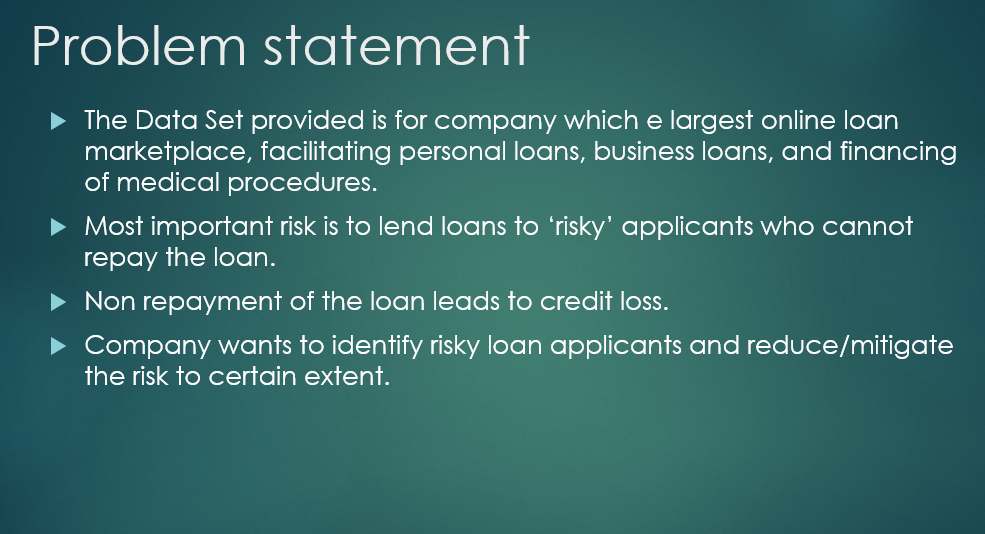

In [283]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns

In [311]:
print("Seaborn version:", sns.__version__)
print("Pandas version:", pd.__version__)
print("NumPy version:", np.__version__)

Seaborn version: 0.13.2
Pandas version: 2.2.2
NumPy version: 1.26.4


In [285]:
import warnings
warnings.filterwarnings('ignore')

In [96]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', 50)

In [98]:
df = pd.read_csv('loan.csv')

C:\Users\maagarwal\AppData\Local\Temp\ipykernel_17088\129683778.py:1: DtypeWarning: Columns (47) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('loan.csv')


### Got this error while Importing, will handle this in later section 
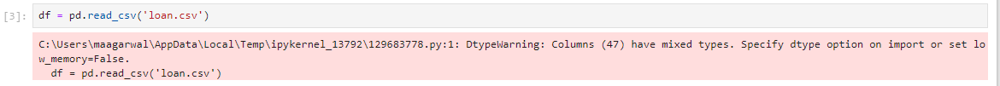


### <font color='black'> Section1: Basic data check  </font>
1. Shape of the data 
2. Data types
3. Missing Values 

#### 1.1 Shape of the data set

In [102]:
df.shape

(39717, 111)

#### <font color='green'> 1.1 Summary: Data has 39K rows and 111 columns  </font>

#### 1.2 Exploring column types (there are 111 columns) 

In [106]:
categorical_columns = df.select_dtypes('object').columns.tolist()
print(f"Count of Categorical Columns:{len(categorical_columns)}")
print('***********************************')
print(f"Categorical Columns:\n{categorical_columns}")

Count of Categorical Columns:24
***********************************
Categorical Columns:
['term', 'int_rate', 'grade', 'sub_grade', 'emp_title', 'emp_length', 'home_ownership', 'verification_status', 'issue_d', 'loan_status', 'pymnt_plan', 'url', 'desc', 'purpose', 'title', 'zip_code', 'addr_state', 'earliest_cr_line', 'revol_util', 'initial_list_status', 'last_pymnt_d', 'next_pymnt_d', 'last_credit_pull_d', 'application_type']


In [108]:
numerical_columns = df.select_dtypes('int64').columns.tolist()
print(f"Count of Numerical Columns:{len(numerical_columns)}")
print('***********************************')
print(f"Numerical Columns:\n{numerical_columns}")

Count of Numerical Columns:13
***********************************
Numerical Columns:
['id', 'member_id', 'loan_amnt', 'funded_amnt', 'delinq_2yrs', 'inq_last_6mths', 'open_acc', 'pub_rec', 'revol_bal', 'total_acc', 'policy_code', 'acc_now_delinq', 'delinq_amnt']


In [110]:
float_columns = df.select_dtypes('float64').columns.tolist()
print(f"Count of Float Columns:{len(float_columns)}")
print('***********************************')
print(f"Float Columns:\n{float_columns}")

Count of Float Columns:74
***********************************
Float Columns:
['funded_amnt_inv', 'installment', 'annual_inc', 'dti', 'mths_since_last_delinq', 'mths_since_last_record', 'out_prncp', 'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee', 'recoveries', 'collection_recovery_fee', 'last_pymnt_amnt', 'collections_12_mths_ex_med', 'mths_since_last_major_derog', 'annual_inc_joint', 'dti_joint', 'verification_status_joint', 'tot_coll_amt', 'tot_cur_bal', 'open_acc_6m', 'open_il_6m', 'open_il_12m', 'open_il_24m', 'mths_since_rcnt_il', 'total_bal_il', 'il_util', 'open_rv_12m', 'open_rv_24m', 'max_bal_bc', 'all_util', 'total_rev_hi_lim', 'inq_fi', 'total_cu_tl', 'inq_last_12m', 'acc_open_past_24mths', 'avg_cur_bal', 'bc_open_to_buy', 'bc_util', 'chargeoff_within_12_mths', 'mo_sin_old_il_acct', 'mo_sin_old_rev_tl_op', 'mo_sin_rcnt_rev_tl_op', 'mo_sin_rcnt_tl', 'mort_acc', 'mths_since_recent_bc', 'mths_since_recent_bc_dlq', 'mths

#### <font color='green'> 1.2 Summary: Data has 39K rows and 111 columns  </font>
- Int64: 13 columns,
- Float64: 74 columns,
- Object: 24 columns 

#### 1.3 Checking for missing values 

In [114]:
df.isnull().sum().tolist()

[0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 2459,
 1075,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 12942,
 0,
 11,
 0,
 0,
 0,
 0,
 0,
 0,
 25682,
 36931,
 0,
 0,
 0,
 50,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 71,
 0,
 38577,
 2,
 56,
 39717,
 0,
 0,
 39717,
 39717,
 39717,
 0,
 39717,
 39717,
 39717,
 39717,
 39717,
 39717,
 39717,
 39717,
 39717,
 39717,
 39717,
 39717,
 39717,
 39717,
 39717,
 39717,
 39717,
 39717,
 39717,
 39717,
 39717,
 56,
 0,
 39717,
 39717,
 39717,
 39717,
 39717,
 39717,
 39717,
 39717,
 39717,
 39717,
 39717,
 39717,
 39717,
 39717,
 39717,
 39717,
 39717,
 39717,
 39717,
 39717,
 39717,
 39717,
 39717,
 39717,
 39717,
 697,
 39,
 39717,
 39717,
 39717,
 39717]

In [74]:
len(df.isnull().sum().tolist())

51

#### <font color='green'>1.3 Number of columns with missing values columns: 51  </font>

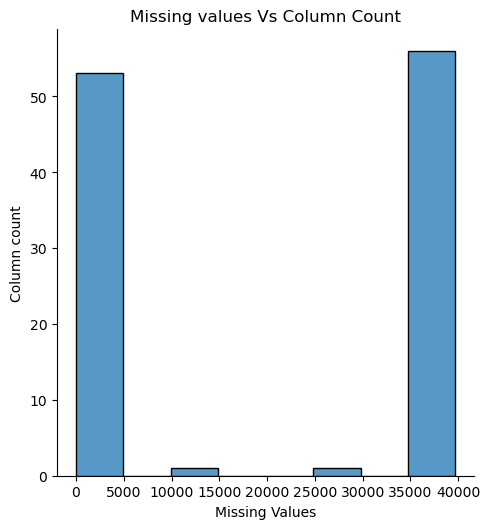

In [122]:
sns.displot(df.isnull().sum().tolist())
plt.title('Missing values Vs Column Count')
plt.xlabel('Missing Values')
plt.ylabel('Column count')
plt.show()

####  <font color='green'> 1.3 There are mainly 4 buckets with missing data.  </font>
1. Columns with missing values < 5000
2. Columns with missing values between 10000 - 15000
3. Columns with missing value between 24000 - 30000
4. Columns with missing values > 35000  

In [154]:
#### Get the list of unique missing value and # of columns impacted 
def get_mis_dist(my_list):
    d_map = {}
    for num in my_list:
        if num in d_map:
            d_map[num] += 1
        else:
            d_map[num] = 1
    return d_map

In [156]:
missing_val_summary = get_mis_dist(df.isnull().sum().tolist())
missing_val_summary

{0: 43,
 2459: 1,
 1075: 1,
 12942: 1,
 11: 1,
 25682: 1,
 36931: 1,
 50: 1,
 71: 1,
 38577: 1,
 2: 1,
 56: 2,
 39717: 54,
 697: 1,
 39: 1}

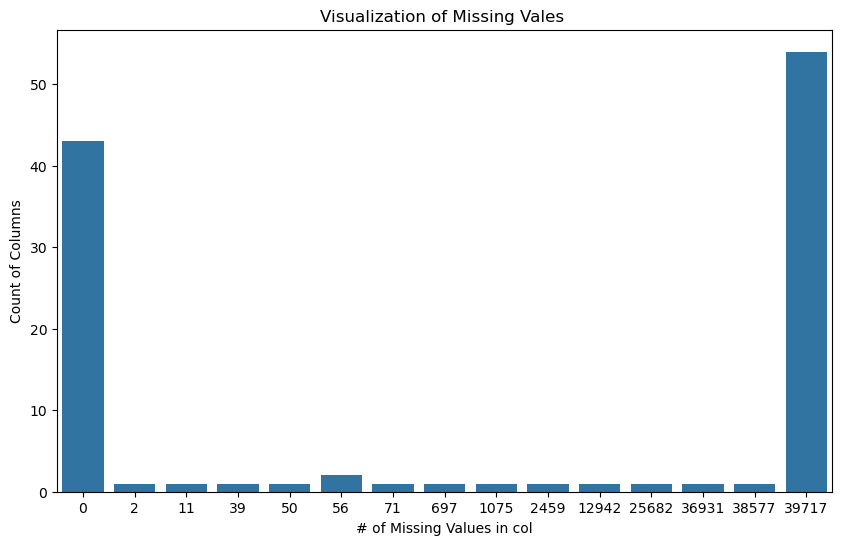

In [131]:
plt.figure(figsize=(10,6))
sns.barplot(x=missing_val_summary.keys(), y=missing_val_summary.values(), data=missing_val_summary)
plt.title('Visualization of Missing Vales ')
plt.xlabel('# of Missing Values in col')
plt.ylabel('Count of Columns')
plt.show()

### Section 2: Dropping all the columns where more than 10% of data is missing i.e columns with following missing values 12942, 25682, 36931, 38577, 39717

In [159]:
df.shape

(39717, 111)

#### 2.1 Get list of all the columns with more than 12942 missing values
Original number of columns : 111

In [162]:
df.isnull().sum()[df.isnull().sum() >=12942]

desc                              12942
mths_since_last_delinq            25682
mths_since_last_record            36931
next_pymnt_d                      38577
mths_since_last_major_derog       39717
annual_inc_joint                  39717
dti_joint                         39717
verification_status_joint         39717
tot_coll_amt                      39717
tot_cur_bal                       39717
open_acc_6m                       39717
open_il_6m                        39717
open_il_12m                       39717
open_il_24m                       39717
mths_since_rcnt_il                39717
total_bal_il                      39717
il_util                           39717
open_rv_12m                       39717
open_rv_24m                       39717
max_bal_bc                        39717
all_util                          39717
total_rev_hi_lim                  39717
inq_fi                            39717
total_cu_tl                       39717
inq_last_12m                      39717


####  <font color='green'> 2.1 Number of columns to be dropped : 58 </font>

In [166]:
len(df.isnull().sum()[df.isnull().sum() >=12942])

58

#### 2.2 Get the names of column and drop them 

In [198]:
# List of columns with missing rows > 12942
df.isnull().sum()[df.isnull().sum() >=12942].index

Index([], dtype='object')

In [150]:
''' df.drop(['desc', 'mths_since_last_delinq', 'mths_since_last_record',
       'next_pymnt_d', 'mths_since_last_major_derog', 'annual_inc_joint',
       'dti_joint', 'verification_status_joint', 'tot_coll_amt', 'tot_cur_bal',
       'open_acc_6m', 'open_il_6m', 'open_il_12m', 'open_il_24m',
       'mths_since_rcnt_il', 'total_bal_il', 'il_util', 'open_rv_12m',
       'open_rv_24m', 'max_bal_bc', 'all_util', 'total_rev_hi_lim', 'inq_fi',
       'total_cu_tl', 'inq_last_12m', 'acc_open_past_24mths', 'avg_cur_bal',
       'bc_open_to_buy', 'bc_util', 'mo_sin_old_il_acct',
       'mo_sin_old_rev_tl_op', 'mo_sin_rcnt_rev_tl_op', 'mo_sin_rcnt_tl',
       'mort_acc', 'mths_since_recent_bc', 'mths_since_recent_bc_dlq',
       'mths_since_recent_inq', 'mths_since_recent_revol_delinq',
       'num_accts_ever_120_pd', 'num_actv_bc_tl', 'num_actv_rev_tl',
       'num_bc_sats', 'num_bc_tl', 'num_il_tl', 'num_op_rev_tl',
       'num_rev_accts', 'num_rev_tl_bal_gt_0', 'num_sats', 'num_tl_120dpd_2m',
       'num_tl_30dpd', 'num_tl_90g_dpd_24m', 'num_tl_op_past_12m',
       'pct_tl_nvr_dlq', 'percent_bc_gt_75', 'tot_hi_cred_lim',
       'total_bal_ex_mort', 'total_bc_limit', 'total_il_high_credit_limit'], axis=1)  '''

" df.drop(['desc', 'mths_since_last_delinq', 'mths_since_last_record',\n       'next_pymnt_d', 'mths_since_last_major_derog', 'annual_inc_joint',\n       'dti_joint', 'verification_status_joint', 'tot_coll_amt', 'tot_cur_bal',\n       'open_acc_6m', 'open_il_6m', 'open_il_12m', 'open_il_24m',\n       'mths_since_rcnt_il', 'total_bal_il', 'il_util', 'open_rv_12m',\n       'open_rv_24m', 'max_bal_bc', 'all_util', 'total_rev_hi_lim', 'inq_fi',\n       'total_cu_tl', 'inq_last_12m', 'acc_open_past_24mths', 'avg_cur_bal',\n       'bc_open_to_buy', 'bc_util', 'mo_sin_old_il_acct',\n       'mo_sin_old_rev_tl_op', 'mo_sin_rcnt_rev_tl_op', 'mo_sin_rcnt_tl',\n       'mort_acc', 'mths_since_recent_bc', 'mths_since_recent_bc_dlq',\n       'mths_since_recent_inq', 'mths_since_recent_revol_delinq',\n       'num_accts_ever_120_pd', 'num_actv_bc_tl', 'num_actv_rev_tl',\n       'num_bc_sats', 'num_bc_tl', 'num_il_tl', 'num_op_rev_tl',\n       'num_rev_accts', 'num_rev_tl_bal_gt_0', 'num_sats', 'num_tl_

###   <font color='red'> Jupyter notebook going out or memory while droppig columns. Collab didnt worked, will detele the columns manually.   </font>
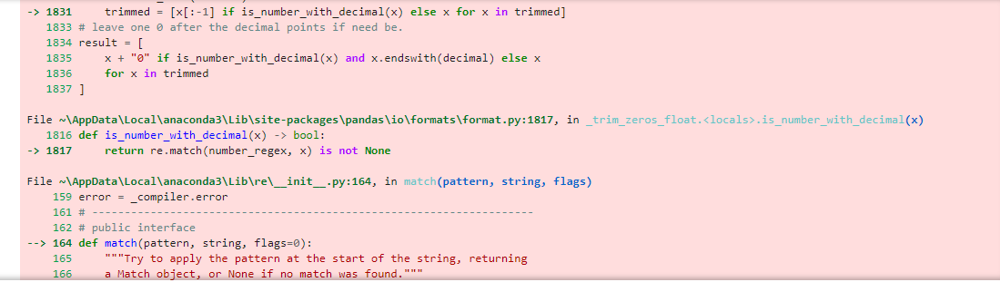

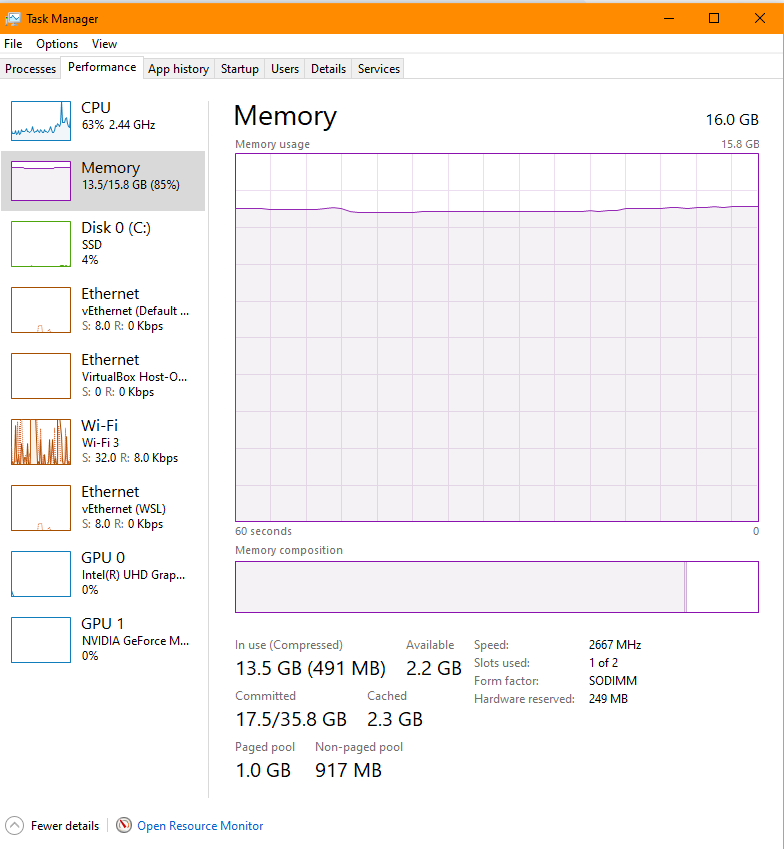

## Section 2 (End): <font color='green'> Deleted columns manually, </font> additonally dropped column "id, member_id"

## Section 3: Handling left over missing values 

In [3]:
df = pd.read_csv('loan_after_drop.csv')

In [5]:
df.shape

(39717, 51)

In [7]:
# Checking if there is any column with missing values greated than 12942
df.isnull().sum()[df.isnull().sum() >=12942]

Series([], dtype: int64)

#### 3.1 Identify all the columns with missing values 

In [10]:
df.isnull().sum()

loan_amnt                        0
funded_amnt                      0
funded_amnt_inv                  0
term                             0
int_rate                         0
installment                      0
grade                            0
sub_grade                        0
emp_title                     2459
emp_length                    1075
home_ownership                   0
annual_inc                       0
verification_status              0
issue_d                          0
loan_status                      0
pymnt_plan                       0
url                              0
purpose                          0
title                           11
zip_code                         0
addr_state                       0
dti                              0
delinq_2yrs                      0
earliest_cr_line                 0
inq_last_6mths                   0
open_acc                         0
pub_rec                          0
revol_bal                        0
revol_util          

In [12]:
df.isnull().sum()[df.isnull().sum() > 0]

emp_title                     2459
emp_length                    1075
title                           11
revol_util                      50
last_pymnt_d                    71
last_credit_pull_d               2
collections_12_mths_ex_med      56
chargeoff_within_12_mths        56
pub_rec_bankruptcies           697
tax_liens                       39
dtype: int64

#### 3.1 Handling emp_title for missing data 

In [15]:
df['emp_title'].value_counts

<bound method IndexOpsMixin.value_counts of 0                               NaN
1                             Ryder
2                               NaN
3               AIR RESOURCES BOARD
4          University Medical Group
                    ...            
39712               FiSite Research
39713    Squarewave Solutions, Ltd.
39714                           NaN
39715                           NaN
39716              Evergreen Center
Name: emp_title, Length: 39717, dtype: object>

#### <font color='green'> 3.1 It is difficult to predict a title, they are very subjective, dropping missing emp_title </font>

In [18]:
df.dropna(subset=['emp_title'], axis = 0, inplace = True)

In [20]:
df.isnull().sum()[df.isnull().sum() > 0]

emp_length                     56
title                           9
revol_util                     46
last_pymnt_d                   64
collections_12_mths_ex_med     47
chargeoff_within_12_mths       47
pub_rec_bankruptcies          654
tax_liens                      32
dtype: int64

#### 3.2 Handling emp_length for missing data 

In [23]:
(df['emp_length'].value_counts())

emp_length
10+ years    8535
2 years      4273
< 1 year     4201
3 years      3982
4 years      3357
5 years      3177
1 year       3134
6 years      2158
7 years      1722
8 years      1435
9 years      1228
Name: count, dtype: int64

#### <font color='green'> 3.2 It is difficult to predict a emp duration, they are very subjective, dropping missing emp_hength </font>

In [26]:
df.dropna(subset=['emp_length'], axis = 0, inplace = True)

In [28]:
df.isnull().sum()[df.isnull().sum() > 0]

title                           9
revol_util                     46
last_pymnt_d                   64
collections_12_mths_ex_med     47
chargeoff_within_12_mths       47
pub_rec_bankruptcies          654
tax_liens                      32
dtype: int64

#### 3.3 Handling 'title' for missing data 

In [31]:
len(df['title'].value_counts())

18390

#### <font color='green'> 3.3 There are close to 19K different titles and only 11 are missing, dropping the records </font>

In [34]:
df.dropna(subset=['title'], axis = 0, inplace = True)

In [36]:
df.isnull().sum()[df.isnull().sum() > 0]

revol_util                     46
last_pymnt_d                   64
collections_12_mths_ex_med     47
chargeoff_within_12_mths       47
pub_rec_bankruptcies          654
tax_liens                      32
dtype: int64

#### 3.4 Handling 'revol_util' for missing data 

In [39]:
(df['revol_util'].value_counts())

revol_util
0%        883
0.20%      60
63%        58
66.60%     55
64.80%     55
         ... 
0.83%       1
47.36%      1
24.65%      1
10.61%      1
7.28%       1
Name: count, Length: 1082, dtype: int64

In [41]:
print( "Mode for 'revol_util' is", df['revol_util'].mode())

Mode for 'revol_util' is 0    0%
Name: revol_util, dtype: object


In [43]:
df = df.fillna({'revol_util': '0%'})

In [45]:
(df['revol_util'].value_counts())

revol_util
0%        929
0.20%      60
63%        58
66.60%     55
64.80%     55
         ... 
0.83%       1
47.36%      1
24.65%      1
10.61%      1
7.28%       1
Name: count, Length: 1082, dtype: int64

#### <font color='green'> 3.4 Filling 'revol_util' with mode which is '0%'  </font>

#### 3.5 Handling 'last_pymnt_d' for missing data 

In [49]:
(df['last_pymnt_d'].value_counts())

last_pymnt_d
16-May    1174
13-Mar     969
14-Dec     876
13-May     856
13-Feb     817
          ... 
8-Nov       10
8-Apr       10
8-Mar        5
8-Jan        2
8-Feb        1
Name: count, Length: 101, dtype: int64

In [51]:
df = df.fillna({'last_pymnt_d': '16-May'})

#### <font color='green'> 3.5 Filling 'last_pymnt_d' with mode which is '16-May'  </font>

#### 3.6 Handling 'collections_12_mths_ex_med', 'chargeoff_within_12_mths ', 'tax_liens' for missing data - Dropping the rows 

In [55]:
df.dropna(subset=['collections_12_mths_ex_med', 'chargeoff_within_12_mths', 'tax_liens'], axis = 0, inplace = True)

#### <font color='green'> 3.6 'collections_12_mths_ex_med', 'chargeoff_within_12_mths', 'tax_liens' dropping rows since there number of rows are only 47, 47 and 32 respectively   </font>

#### 3.7 Handling 'pub_rec_bankruptcies' for missing data, as per data Dictionary "Number of public record bankruptcies"

In [59]:
(df['pub_rec_bankruptcies'].value_counts())

pub_rec_bankruptcies
0.0    35030
1.0     1500
2.0        7
Name: count, dtype: int64

In [61]:
df = df.fillna({'pub_rec_bankruptcies': 0.0})

#### <font color='green'> 3.7 Assuming that there is no public record for these customers, filling with 0.0  </font>

In [64]:
df.shape

(37146, 51)

In [66]:
df.isnull().sum()[df.isnull().sum() > 0]

Series([], dtype: int64)

### <font color='blue'> End of Section 3, With no missing records, column count 37146 and row count 51  </font>

## <font color='blue'> Section 4: Starting with EDA for the Data Set  </font>

In [307]:
categorical_columns = df.select_dtypes('object').columns.tolist()
numerical_int64_columns = df.select_dtypes('float64').columns.tolist()
numerical_float64_columns = df.select_dtypes('int64').columns.tolist()
print( f'Categorical: {len(categorical_columns)}, Numerical-int64: {len(numerical_int64_columns)}, Numerical-float64: {len(numerical_float64_columns)}')

Categorical: 22, Numerical-int64: 18, Numerical-float64: 11


In [72]:
df.loan_status.value_counts()

loan_status
Fully Paid     30956
Charged Off     5124
Current         1066
Name: count, dtype: int64

## Section 4: EDA for categorical columns

#### <font color='black'> Filtering only the rows where customer defaulted <font color='blue'> loan_status = Charged Off   </font></font>

In [76]:
df_focus = df[df['loan_status'] == 'Charged Off']

In [78]:
df_focus.shape

(5124, 51)

In [80]:
categorical_columns

['term',
 'int_rate',
 'grade',
 'sub_grade',
 'emp_title',
 'emp_length',
 'home_ownership',
 'verification_status',
 'issue_d',
 'loan_status',
 'pymnt_plan',
 'url',
 'purpose',
 'title',
 'zip_code',
 'addr_state',
 'earliest_cr_line',
 'revol_util',
 'initial_list_status',
 'last_pymnt_d',
 'last_credit_pull_d',
 'application_type']

#### <font color='black'> Filtering columns with categories equal to 1 and upto 20 (since my notebook is crashing)  <font color='blue'> 

### <font color='red'> Finding Memory issue with my machine, jupyter hanging often  </font>

In [255]:
categorical_columns_upto20 = []
for colname in categorical_columns:
    if (len(df[colname].value_counts()) <= 20) & (len(df[colname].value_counts()) > 1):
        categorical_columns_upto20.append(colname)    

In [152]:
categorical_columns_upto20

['term',
 'grade',
 'emp_length',
 'home_ownership',
 'verification_status',
 'loan_status',
 'purpose']

#### <font color='black'> 4.1: Creating count plots for the numeric columns   </font>

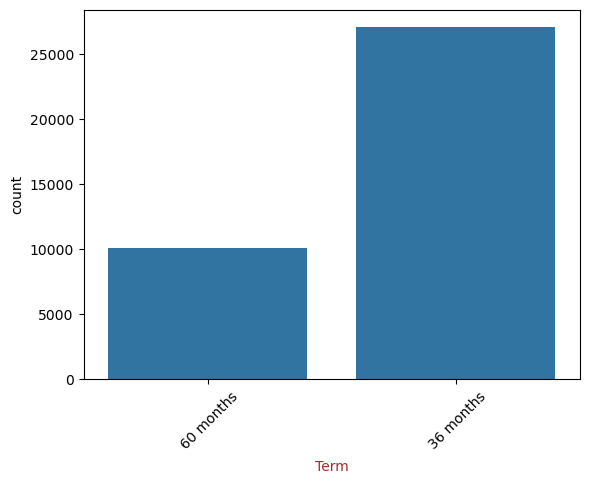

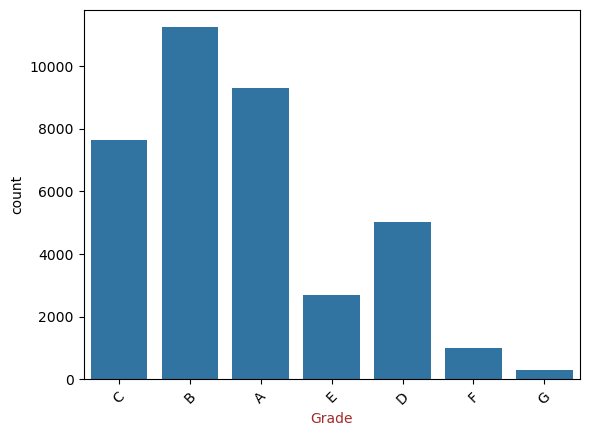

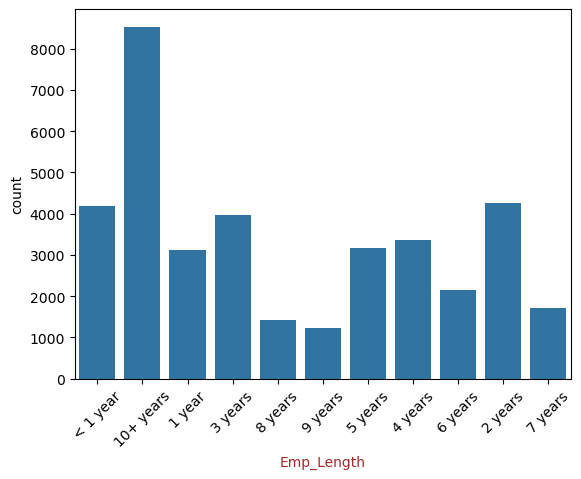

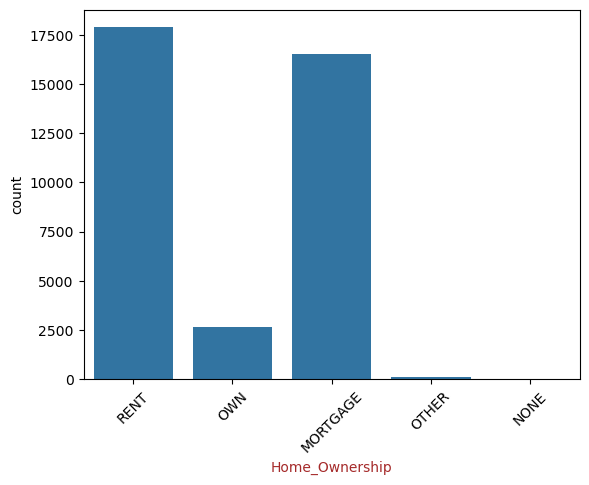

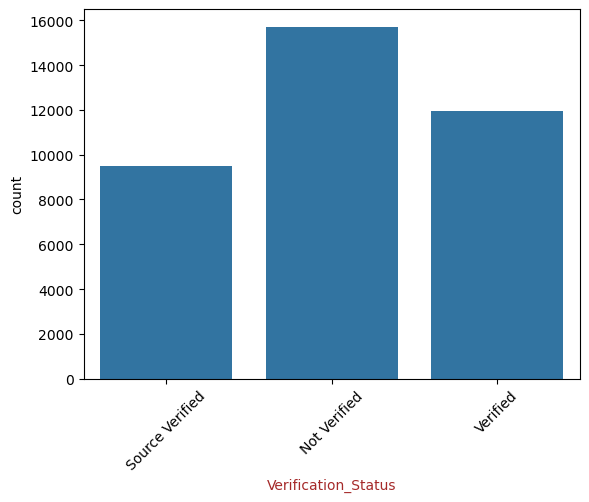

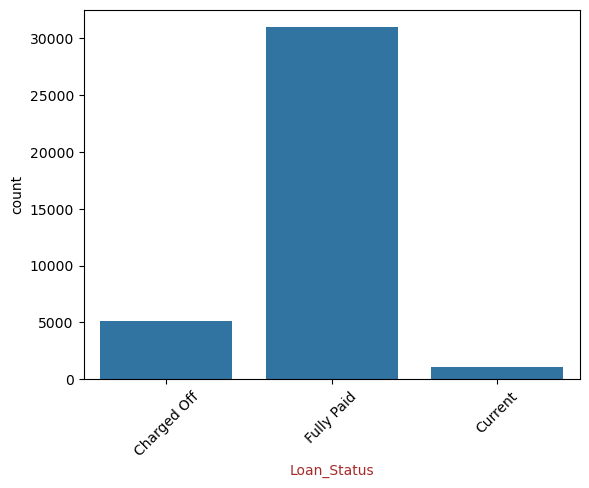

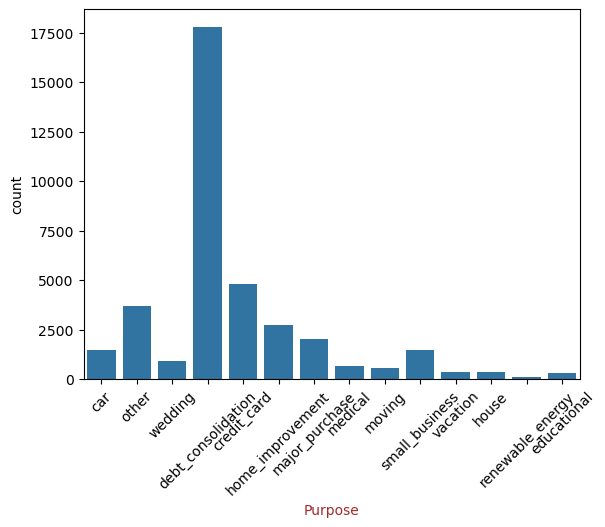

In [257]:
for colname in categorical_columns_upto20:
    sns.countplot(x = df[colname])
    plt.xlabel(colname.title(), color = 'brown')
    plt.xticks(rotation=45)
    plt.show()

## <font color='Green'> Summary of categorical columns </font>
1. Loan with shorter term 36month(Vs 60 month) have a higher chance to default
2. People with ower grades A, B, C have a higher chance to default, especially with Grade B
3. Someoone with 10+ years of service is likely to default more than others
4. People of RENT are likely to default more, followed by people having additonal Mortage
5. People who are not verified are likely to default more than people who are verified, followed by people who are Source verified
   

## Section 5: EDA for numerical columns 

In [261]:
numerical_int64_columns

['funded_amnt_inv',
 'installment',
 'annual_inc',
 'dti',
 'out_prncp',
 'out_prncp_inv',
 'total_pymnt',
 'total_pymnt_inv',
 'total_rec_prncp',
 'total_rec_int',
 'total_rec_late_fee',
 'recoveries',
 'collection_recovery_fee',
 'last_pymnt_amnt',
 'collections_12_mths_ex_med',
 'chargeoff_within_12_mths',
 'pub_rec_bankruptcies',
 'tax_liens']

#### <font color='black'> 5.1: Creating scatter plots(Bi variate) for the numeric columns   </font>

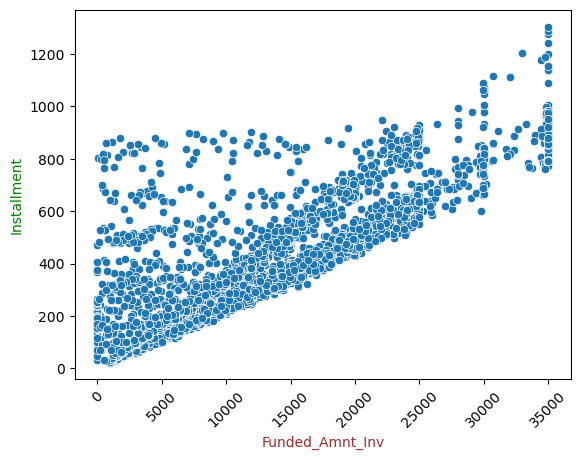

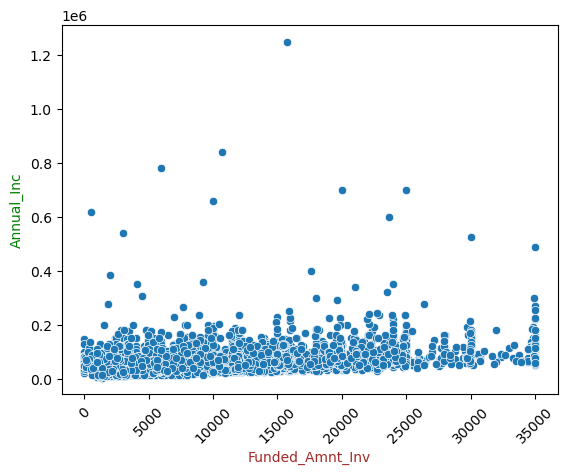

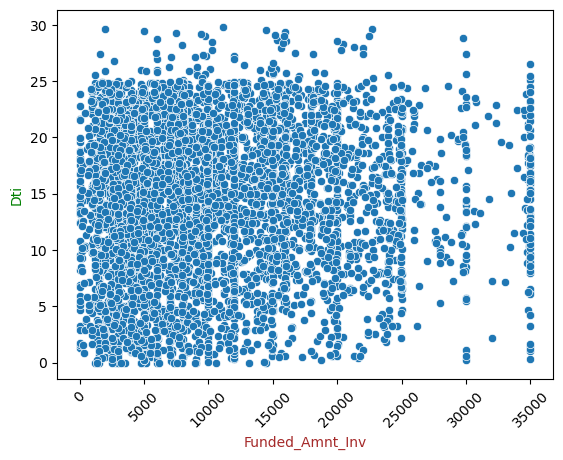

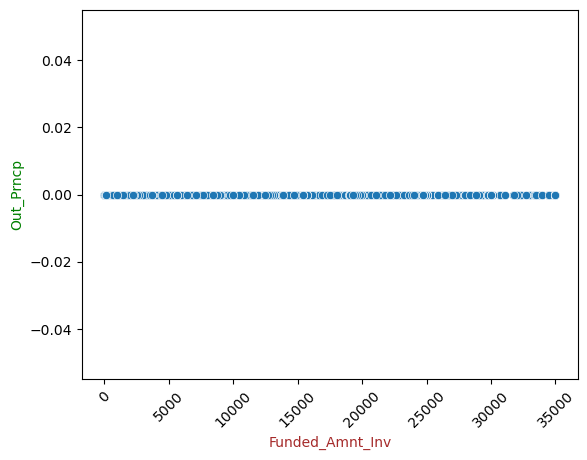

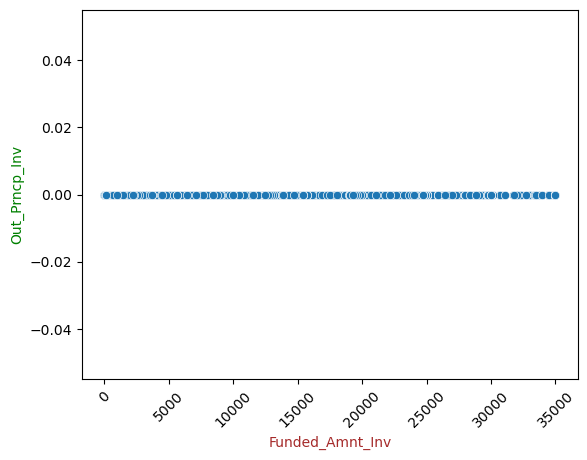

...

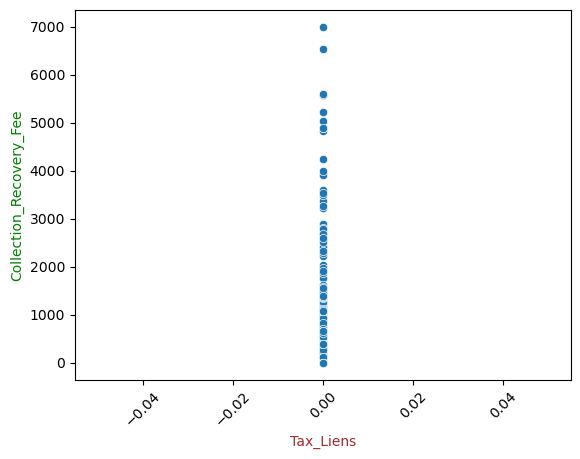

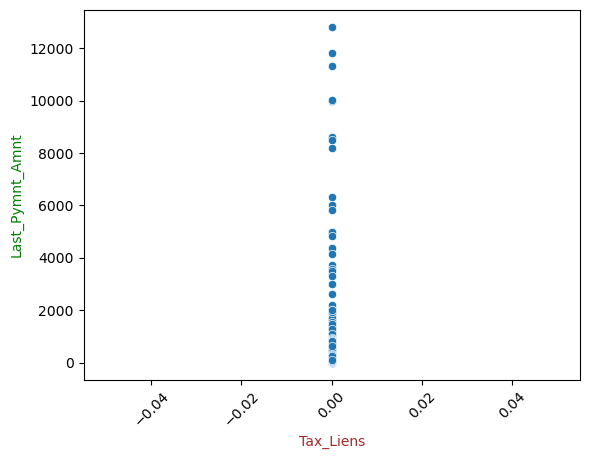

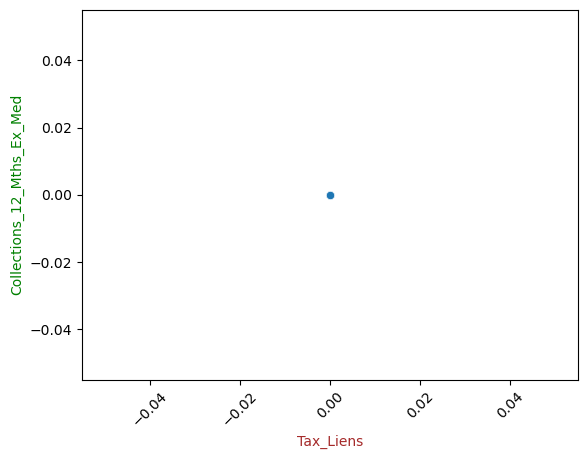

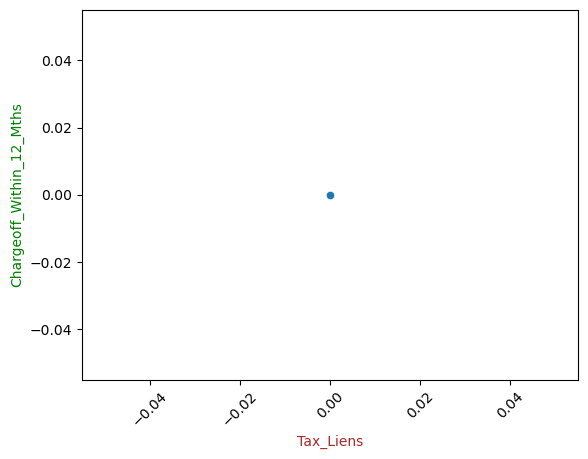

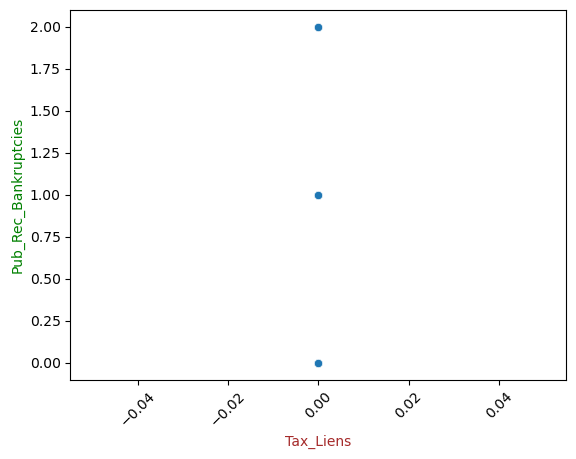

In [181]:
for colname_x in numerical_int64_columns:
    for colname_y in numerical_int64_columns:
        if colname_x != colname_y:
            sns.scatterplot(df_focus, x = colname_x , y = colname_y )
            plt.xlabel(colname_x.title(), color = 'brown')
            plt.ylabel(colname_y.title(), color = 'green')
            plt.xticks(rotation=45)
            plt.show() 
    

#### <font color='Green'> 5.1: Summary of bi variate numeric(int64) columns for columns with some co relation   </font>
1. Intallment amount and Funded amount are co - related
2. Total payment and Funded amount are co-related

NO SPECIFIC Important insights form these co - relation. All the data points in the data are ones with laon defaulted. 


#### <font color='black'> 5.2: Creating univariate graphs  for the numeric(int64) columns   </font>

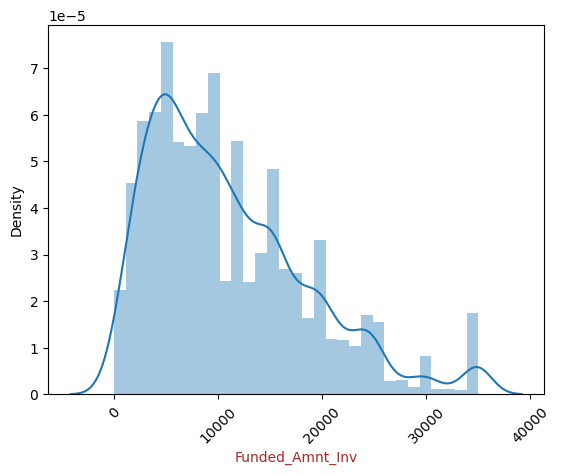

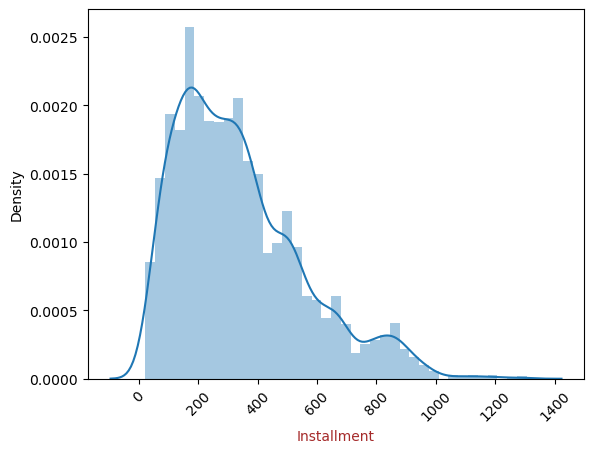

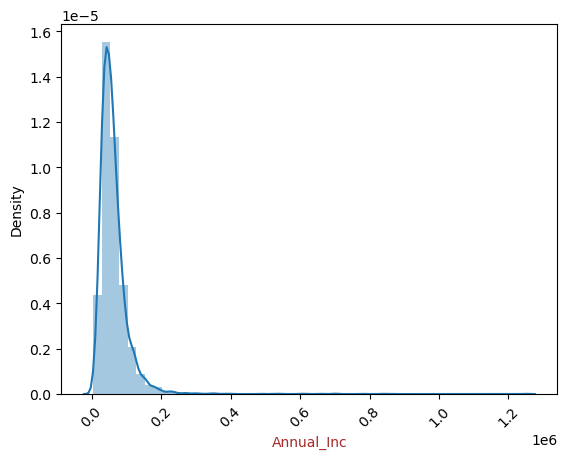

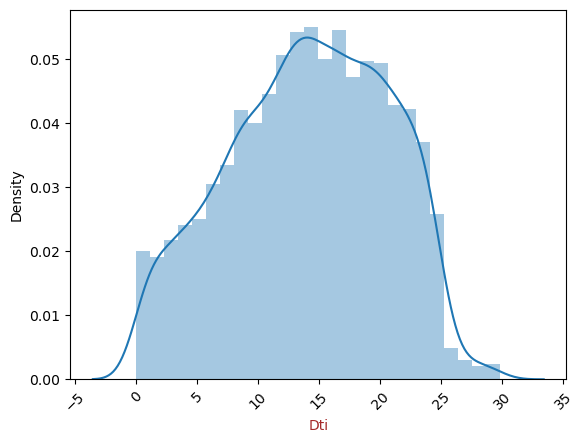

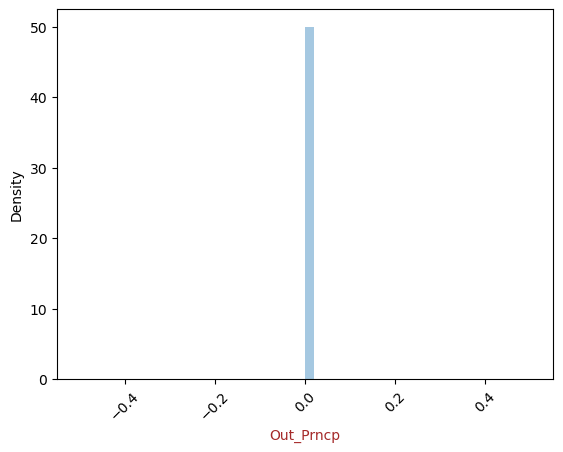

...

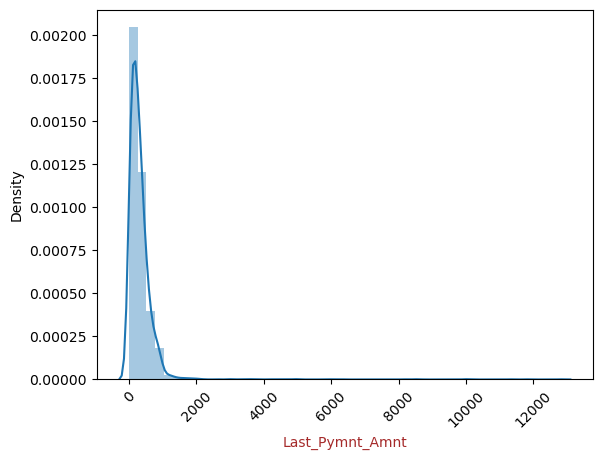

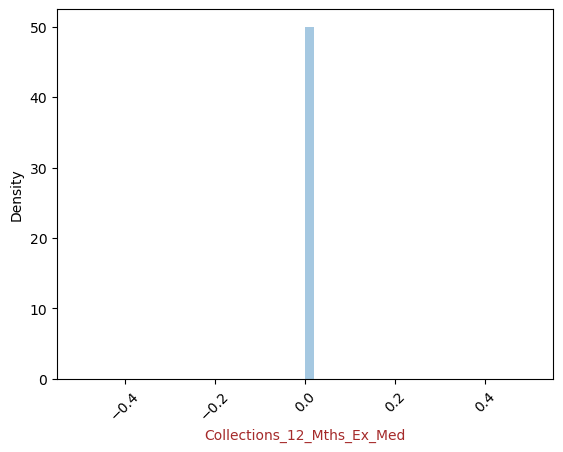

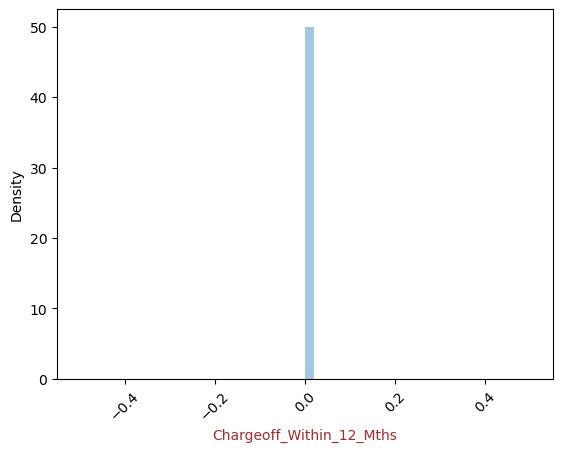

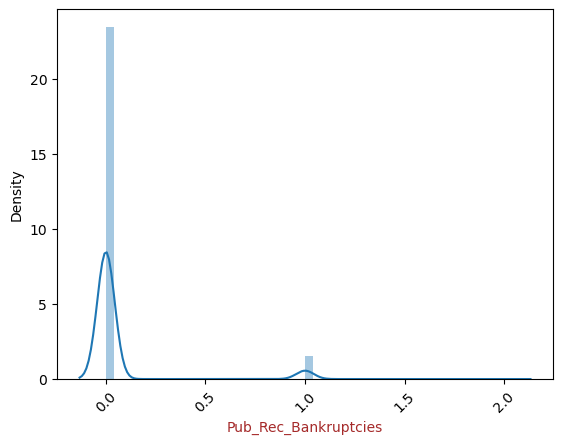

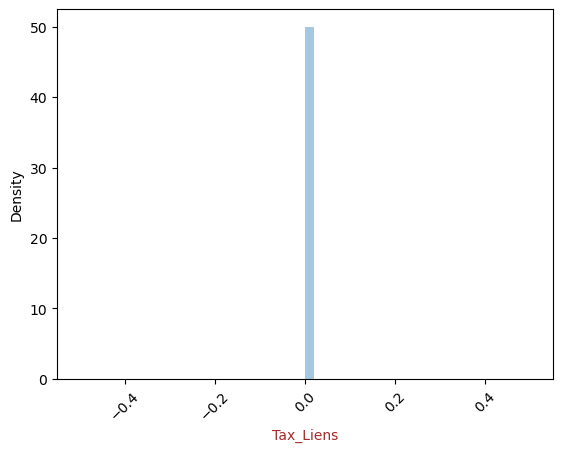

In [274]:
for colname in numerical_int64_columns:
    sns.distplot(x = df_focus[colname] )
    plt.xlabel(colname.title(), color = 'brown')
    plt.xticks(rotation=45)
    plt.show()

#### <font color='Green'> 5.2: Summary of uni variate numeric(int64) columns for columns with some co relation   </font>
1. Loan with funded amount less than 1000 have a higher chance of default
2. Loans with lower installment have a higher chance of default


## <font color='Green'> End Section 5. Summary of numerical columns </font>

## Section 6: EDA for numerical columns - Float64

#### <font color='black'> 6.1: Creating scatter plots for the numeric(Float64 ) columns </font>

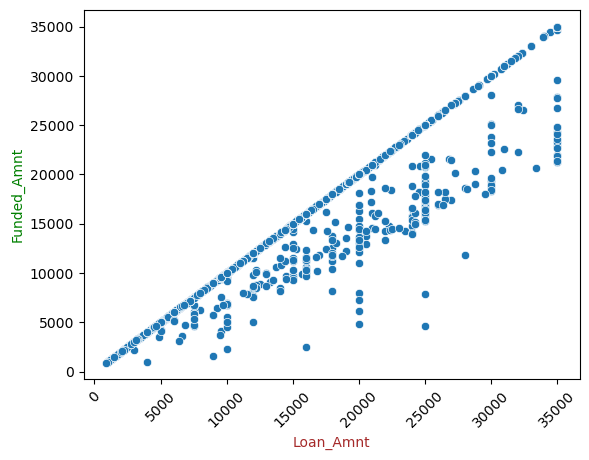

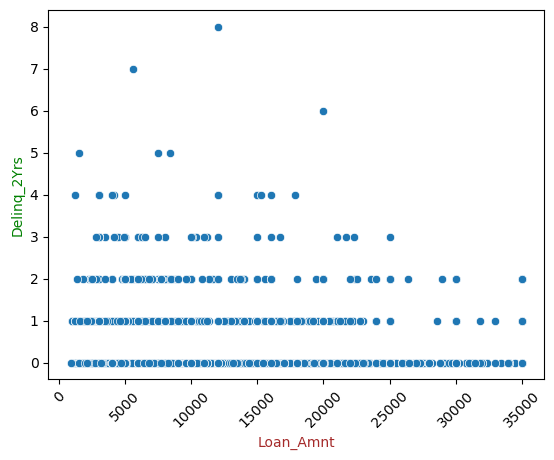

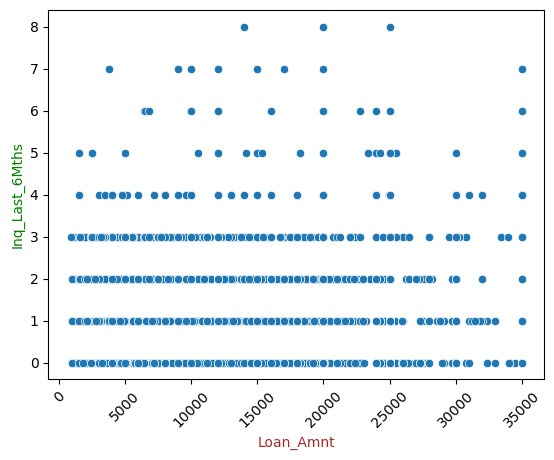

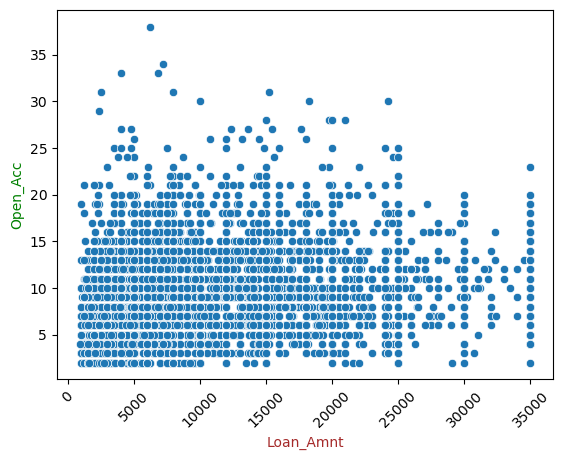

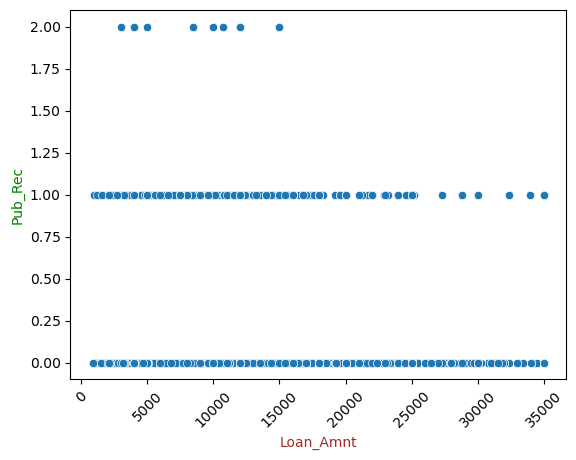

...

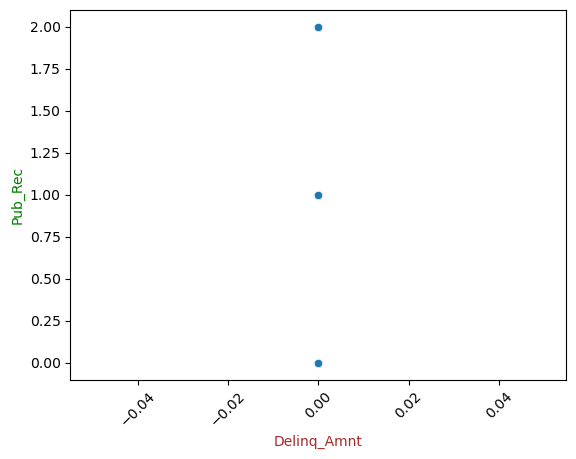

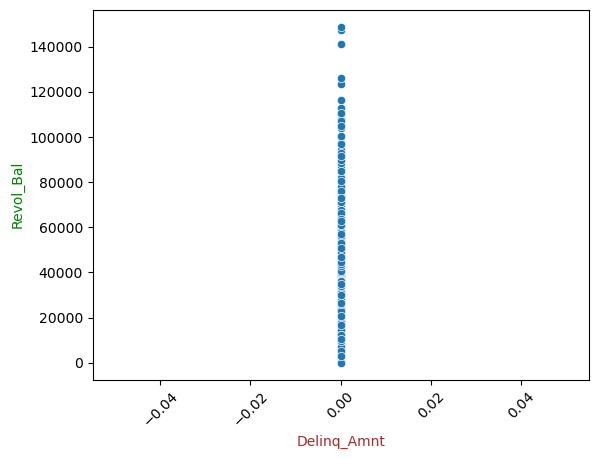

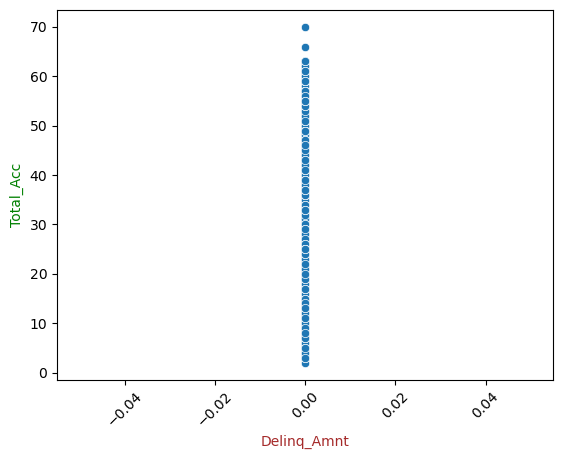

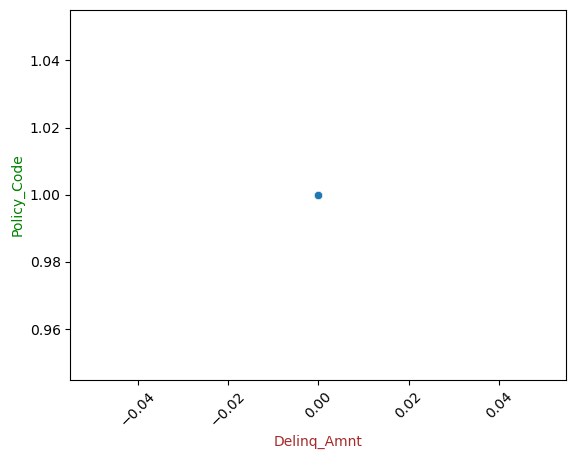

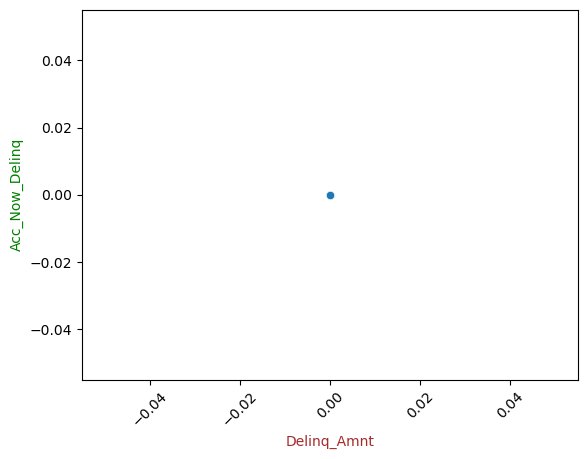

In [194]:
for colname_x in numerical_float64_columns:
    for colname_y in numerical_float64_columns:
        if colname_x != colname_y:
            sns.scatterplot(df_focus, x = colname_x , y = colname_y )
            plt.xlabel(colname_x.title(), color = 'brown')
            plt.ylabel(colname_y.title(), color = 'green')
            plt.xticks(rotation=45)
            plt.show() 

#### <font color='Green'> 6.1: Summary of bi variate numeric(float64) columns for columns with some co relation   </font>
1. Funced amt and loan amt are co - related - Trivial

NO SPECIFIC Important insights from these co - relation. All the data points in the data are ones with laon defaulted. 

#### <font color='black'> 6.2: Creating univariate graphs  for the numeric(float64) columns   </font>

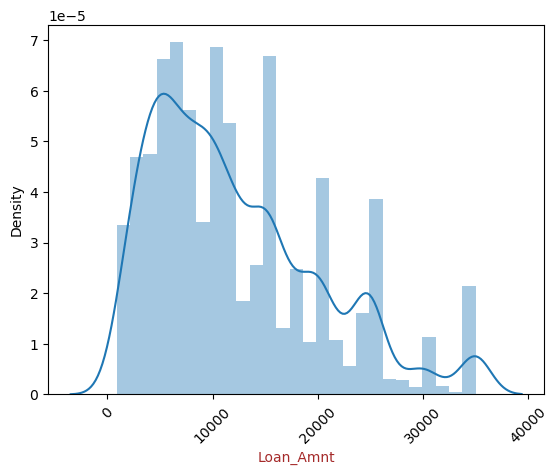

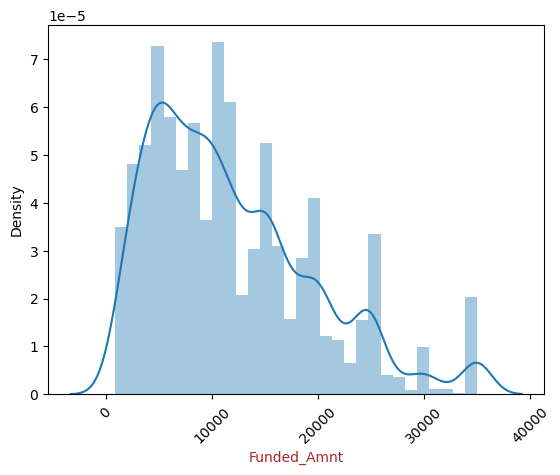

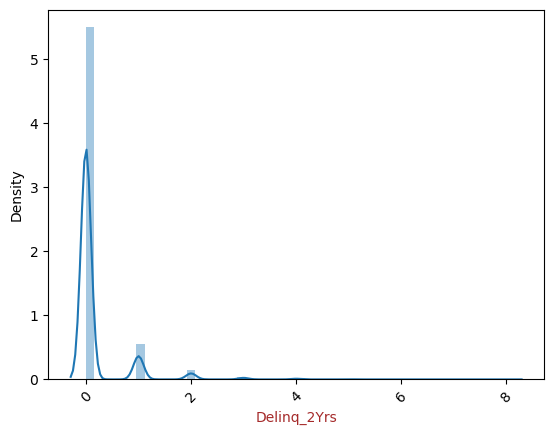

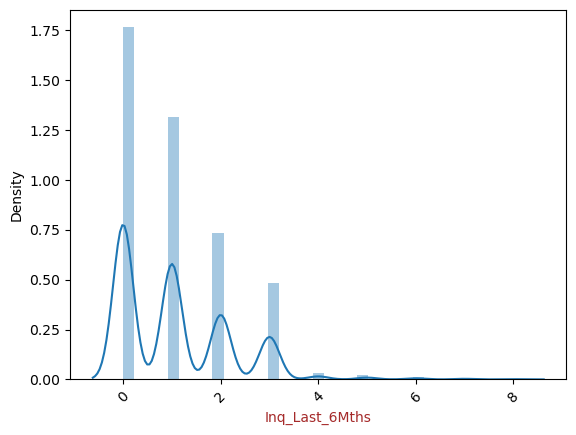

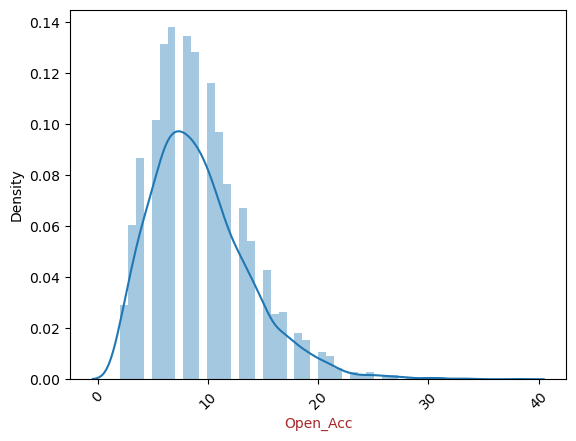

...

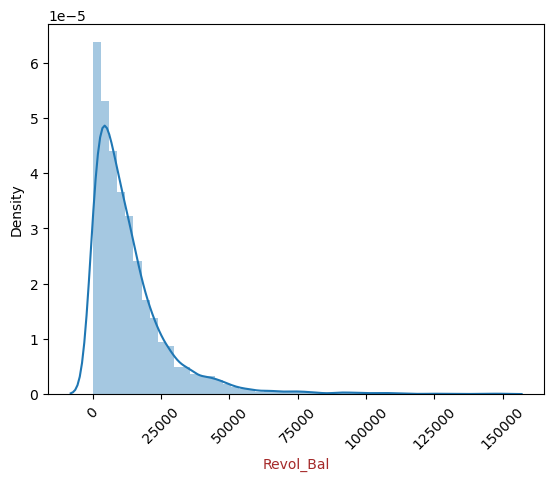

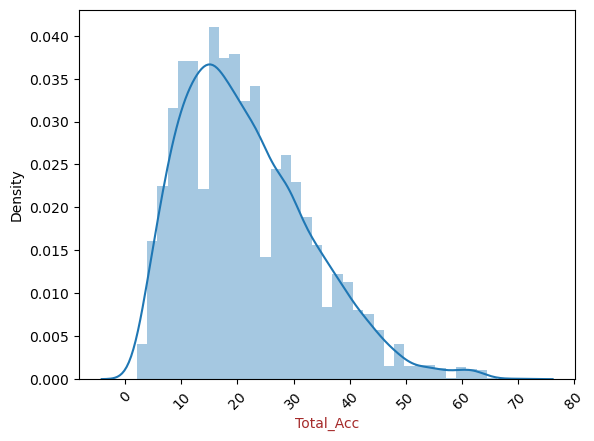

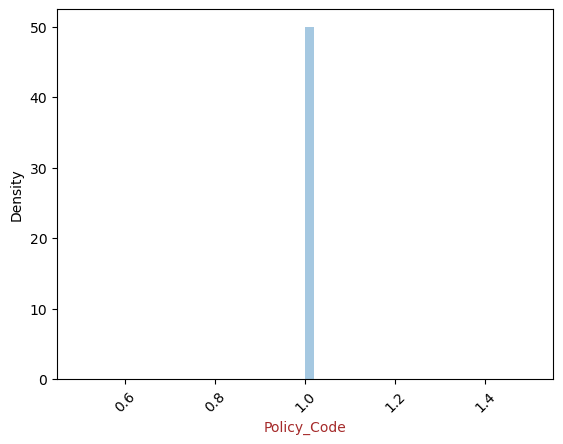

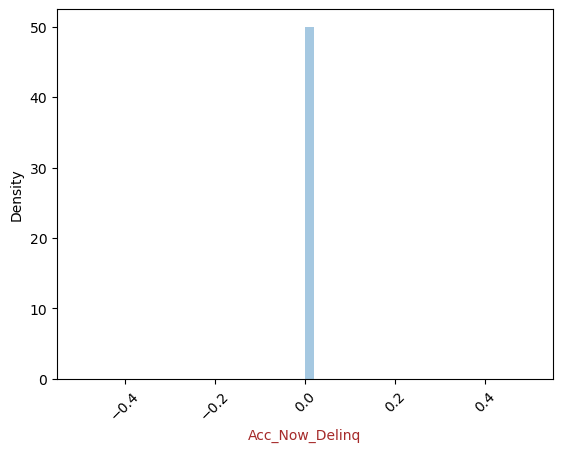

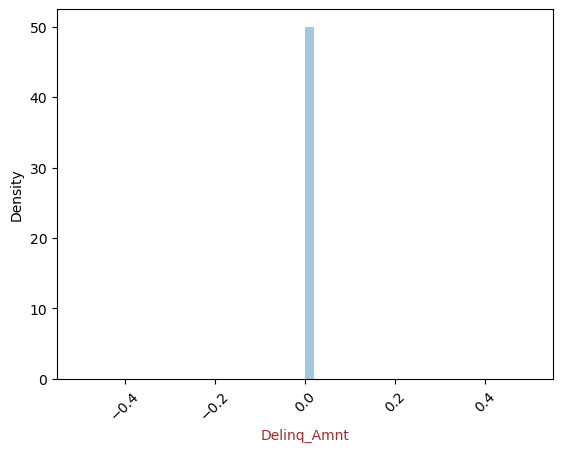

In [281]:
for colname in numerical_float64_columns:
    #sns.countplot(x = df[colname])
    sns.distplot(x = df_focus[colname] )
    plt.xlabel(colname.title(), color = 'brown')
    plt.xticks(rotation=45)
    plt.show()

#### <font color='Green'> 6.2: Summary of uni variate numeric(int64) columns for columns with some co relation   </font>
1. Loan with funded amount less than 1000 have a higher chance of default
2. Loans with lower installment have a higher chance of default


## <font color='Green'> End Section 6. Summary of numerical(float64) columns </font>